# Objectif du notebook 

Date de création : 04/10/2025

L'objectif du notebook est de repositionner les hydrophones H1 à H5 du bassin dans le but de comparer la méthode RTF-MFP à une méthode classique TDOA. 

## Approche retenue 

On utilise les enregistrements des positions statiques P1 à P6 pour positionner chacun des hydrophones. 

In [2]:
import os 
import sys 
import arlpy
import numpy as np 
import xarray as xr
import pandas as pd
import scipy.signal as sp
import matplotlib.pyplot as plt  
sys.path.append(r"C:\Users\baptiste.menetrier\Desktop\devPy\phd")

import params as p
from misc import equivalent_celerity
from scipy.optimize import least_squares
from fiberscope_manager import FiberscopeManager
from fiberscope_recording import FiberscopeSweep1, FiberscopeSweep2

from propa.rtf.rtf_utils import D_hermitian_angle_fast
from publication.publication_figure import PubFigure, color

In [2]:
c0 = 1500   
h_index_ref = 5
img_root = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_20\img\hydro_positioning"

In [3]:
run_static_demo = False

# Load and preprocess static record
fs_sweep = FiberscopeSweep1()
# fs_sweep = FiberscopeSweep2()

records_to_process = fs_sweep.records_N1
# records_to_process = fs_sweep.records_N1 + fs_sweep.records_N3 + fs_sweep.records_N5
fs_sweep.records_folder = os.path.join(p.root_data, "static")
if not os.path.exists(fs_sweep.records_folder):
    os.makedirs(fs_sweep.records_folder)

if run_static_demo:
    fsm = FiberscopeManager(
        root_processed_data=p.root_data, h_index_ref=h_index_ref, plot_feature=True
    )
    fsm.process_static_analysis(
        static_signal=fs_sweep,
        static_records_names=records_to_process,
    )

# Détection des temps d'arrivées

## Détection basée sur l'enveloppe du signal 

Le SNR est très élevé quel que soit le niveau d'émission, une approche simple basée sur l'enveloppe du signal peu être mise en œuvre. 

Détails : 

* Calcul de l'enveloppe du signal 
* Détection du temps d'arrivée grossier : enveloppe du signal > seuil 
* Détection plus précise : point d'inflexion de l'enveloppe sur une petite fenêtre autour du temps d'arrivée grossier 

In [4]:
# # Calcul du temps d'arrivée pour le couple (P1, H1)
# record_name = records_to_process[0]
# print(f"Record to study: {record_name}")
# idx_rcv_to_study = 5

# ds_rtf_fpath = os.path.join(p.root_data, "static", f"{record_name}_rtf.nc")
# ds_rtf = xr.open_dataset(ds_rtf_fpath)
# fs = ds_rtf.fs
# sig = ds_rtf.signal.sel(h_index=idx_rcv_to_study)

Record to study: 09-10-2024T10-34-58-394627_P1_N1_Sweep_34


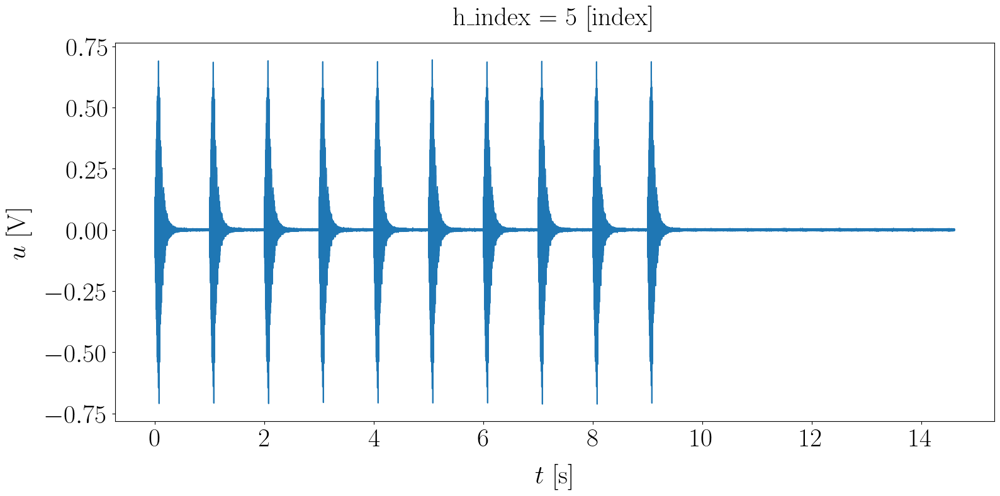

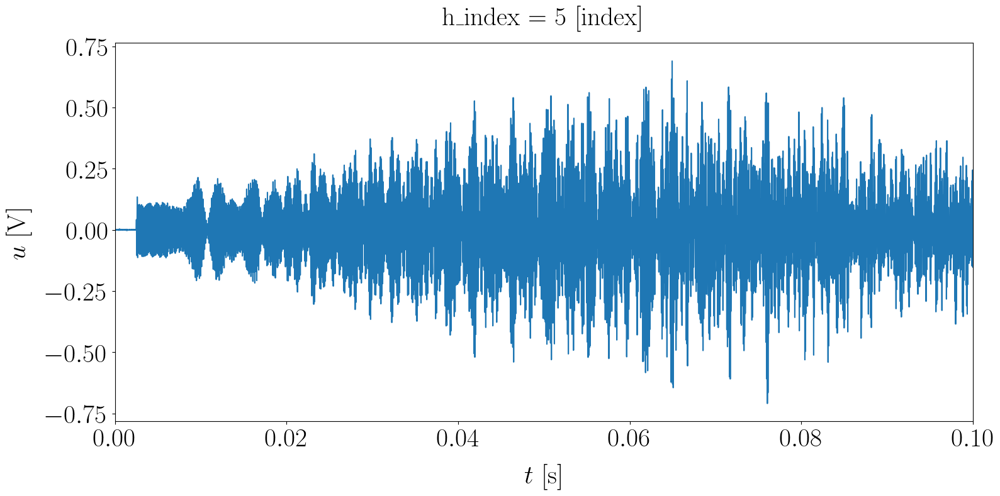

In [5]:
# plt.figure()
# sig.plot()
# fpath = os.path.join(img_root, f"H{idx_rcv_to_study}_sig.png")
# plt.savefig(fpath)
# plt.figure()
# sig.plot()
# plt.xlim([0, 0.1])
# fpath = os.path.join(img_root, f"H{idx_rcv_to_study}_sig_zoom.png")
# plt.savefig(fpath)

### Allure des signaux  

In [46]:
idx_rcv_to_study = 5
print(f"Analysing receiver H{idx_rcv_to_study}")

signals = []
for record_name in records_to_process:
    print(f"Record to study: {record_name}")
    ds_rtf_fpath = os.path.join(p.root_data, "static", f"{record_name}_rtf.nc")
    ds_rtf = xr.open_dataset(ds_rtf_fpath)

    # Trim to first sweep
    ds_rtf = ds_rtf.sel(time=slice(0, fs_sweep.interp_pulse_period))
    sig_i = ds_rtf.signal.sel(h_index=idx_rcv_to_study).values
    # sig_i[ds_rtf.time < 0.005] = 0
    signals.append(sig_i)

signals = np.array(signals)

# Define the order based on the source position : from closest to farthest
dict_th_pos = p.dict_th_pos
all_dists = np.array([dict_th_pos[pos] for pos in dict_th_pos.keys()])
idx_pos_sort = np.argsort(all_dists)
src_labels = list(dict_th_pos.keys())
src_label_sorted = [src_labels[i] for i in idx_pos_sort]

# Sort signals accordingly
signals = signals[idx_pos_sort, :]
time = ds_rtf.time
fs = ds_rtf.fs

Analysing receiver H5
Record to study: 09-10-2024T10-34-58-394627_P1_N1_Sweep_34
Record to study: 09-10-2024T16-51-22-900122_P2_N1_Sweep_93
Record to study: 10-10-2024T09-43-06-620681_P3_N1_Sweep_151
Record to study: 10-10-2024T12-03-02-201689_P4_N1_Sweep_211
Record to study: 10-10-2024T14-42-01-833325_P5_N2_Sweep_267
Record to study: 10-10-2024T15-54-25-737795_P6_N1_Sweep_323


#### Un exemple de signaux reçus

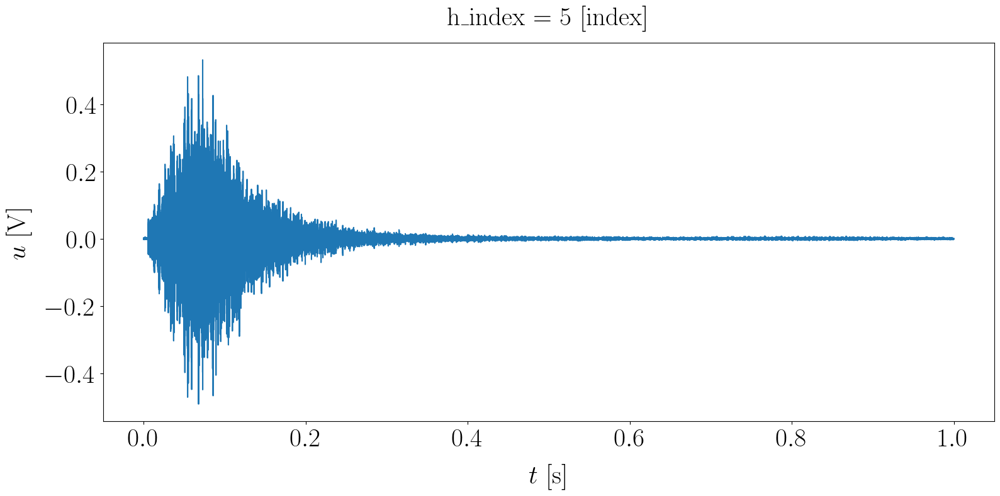

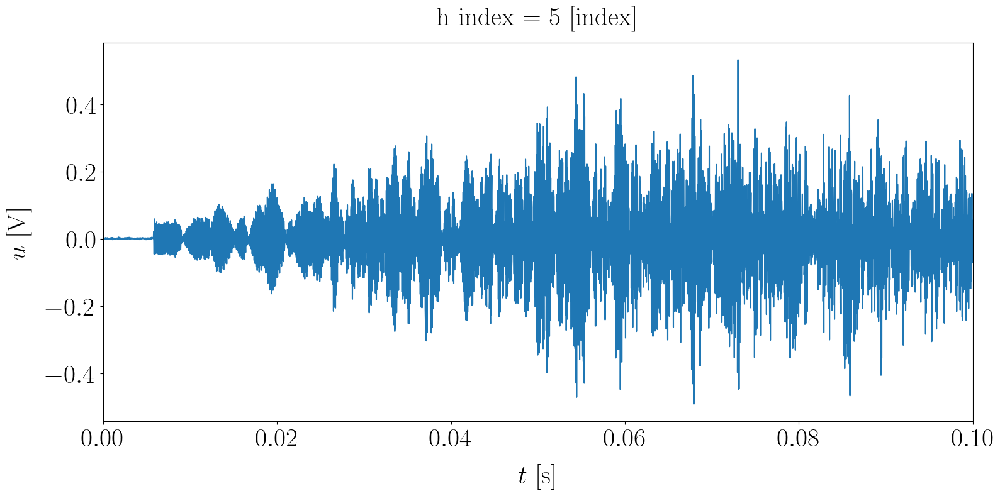

In [55]:
sig = ds_rtf.signal.sel(h_index=idx_rcv_to_study)
plt.figure()
sig.plot()
fpath = os.path.join(img_root, f"H{idx_rcv_to_study}_sig.png")
plt.savefig(fpath)
plt.figure()
sig.plot()
plt.xlim([0, 0.1])
fpath = os.path.join(img_root, f"H{idx_rcv_to_study}_sig_zoom.png")
plt.savefig(fpath)

#### Signaux pour chacune des positions de la source

(0.0, 0.025)

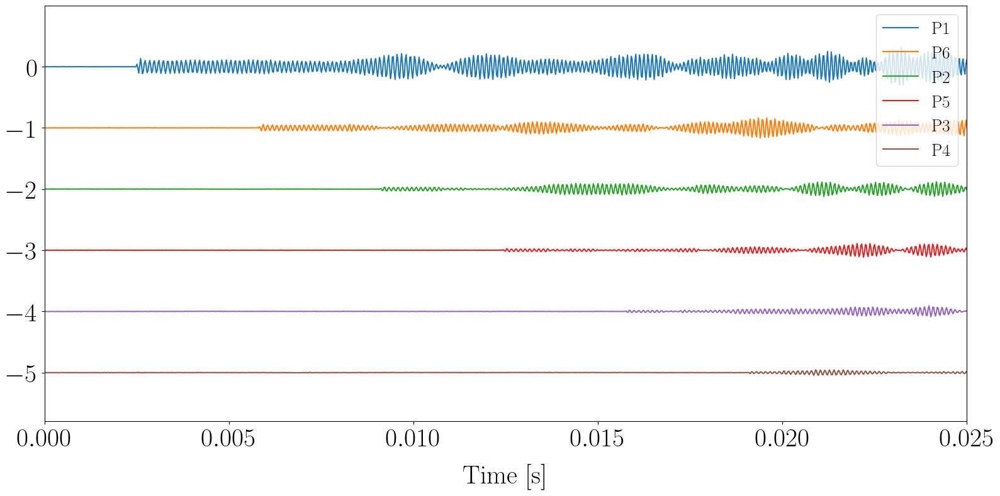

In [56]:
# Stack plot 
delta_y = 1
plt.figure()
for i, sig in enumerate(signals):
    sig_n = sig / np.max(np.abs(sig))
    plt.plot(time, sig - i * delta_y, label=src_label_sorted[i])
plt.legend(loc="upper right")
plt.xlabel("Time [s]")
# plt.ylabel("Amplitude (a.u.)")
plt.xlim([0, 0.025])

## Définition d'une méthode d'estimation des temps d'arrivés

In [57]:
# Define the detection function
def direct_arrival_env(sig, plot=False, save=False):
    # Calcul de l'enveloppe du signal
    sig_h = sp.hilbert(sig)
    sig_env = np.abs(sig_h)
    # sig_phase = np.angle(sig_h)

    # On défini un seuil à 200 % du niveau de bruit
    d_min = 2
    td_min = d_min / c0
    noise_lvl = sig_env[0 : int(td_min * fs)].max()
    env_detection_th = 2 * noise_lvl

    # Recherche du premier pic au dessus du seuil
    idx_peak = np.where(sig_env > env_detection_th)[0][0]
    # On définit un intervalle de reherche autour du pic
    delta_idx_peak = 10
    idx_search_start = max(0, idx_peak - delta_idx_peak)
    t_win_inf = sig.time[idx_search_start]
    idx_search_stop = min(len(sig_env), idx_peak + delta_idx_peak)
    t_win_max = sig.time[idx_search_stop]

    # On calcul la dérivée de l'enveloppe pour trouver le maximum
    ts = 1/fs
    sig_env_deriv = np.gradient(sig_env, ts)
    idx_peak_refined = np.argmax(sig_env_deriv[idx_search_start:idx_search_stop]) + idx_search_start
    t_arrival = sig.time[idx_peak_refined]

    if plot:
        plt.figure()
        plt.plot(sig.time, sig_env)
        plt.axhline(env_detection_th, color="red", linestyle="--")
        plt.xlim([0, sig.time[idx_search_stop] * 1.2])
        # plt.axvline(sig.time[idx_peak], color="green", linestyle="--")
        plt.axvline(sig.time[idx_peak_refined], color="green", linestyle="--")
        plt.axvline(sig.time[idx_search_start], color="orange", linestyle="--")
        plt.axvline(sig.time[idx_search_stop], color="orange", linestyle="--")
        plt.title("Enveloppe")

        if save:
            fpath = os.path.join(img_root, f"H{sig.h_index.values}_env.png")
            plt.savefig(fpath)

        plt.figure()
        sig.plot()
        plt.xlim([0, sig.time[idx_search_stop] * 1.2])
        # plt.axvline(sig.time[idx_peak], color="green", linestyle="--")
        plt.axvline(t_arrival, color="green", linestyle="--")
        plt.axvline(t_win_inf, color="orange", linestyle="--")
        plt.axvline(t_win_max, color="orange", linestyle="--")
        plt.title("Temps d'arrivée")

        if save: 
            fpath = os.path.join(img_root, f"H{sig.h_index.values}_td.png")
            plt.savefig(fpath)

    return t_arrival

#### Illustration pour l'hydrophone étudié

3.7874999999999686
8.737499999999928
13.687499999999888
18.749999999999844
23.699999999999804
28.649999999999764


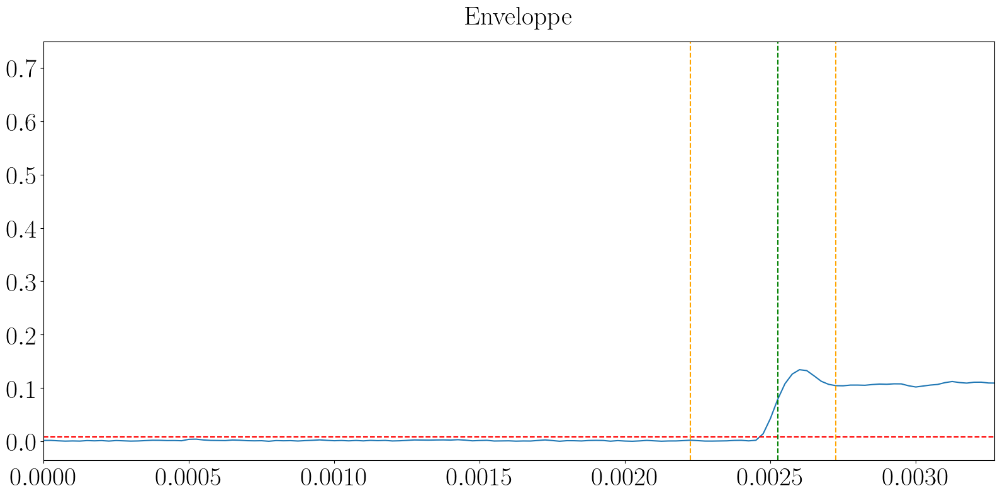

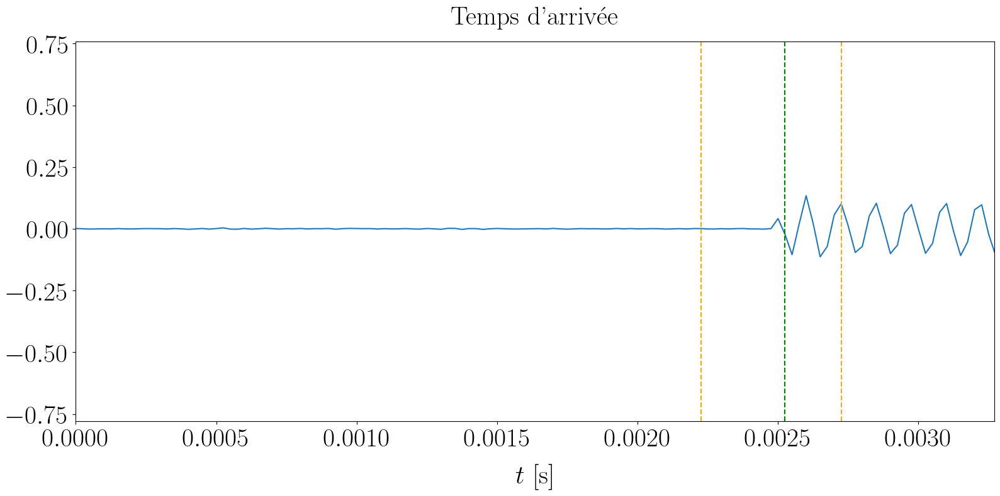

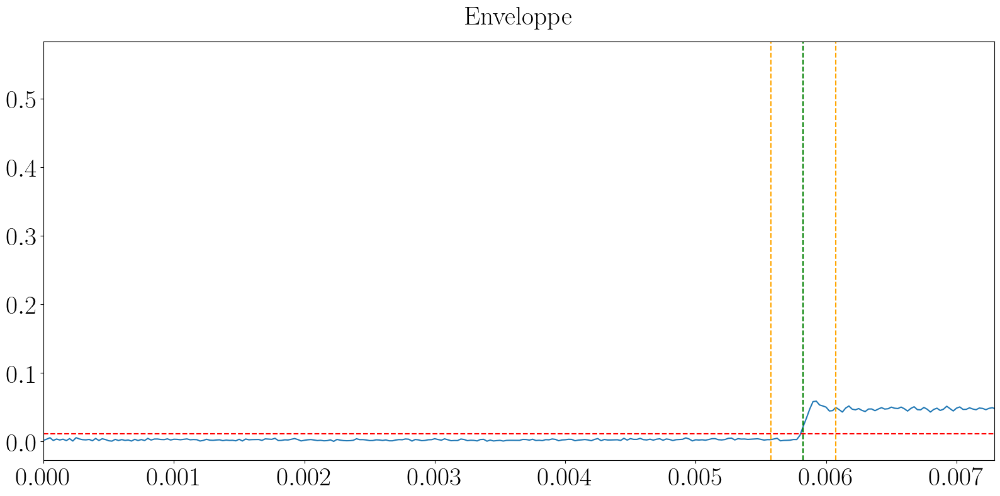

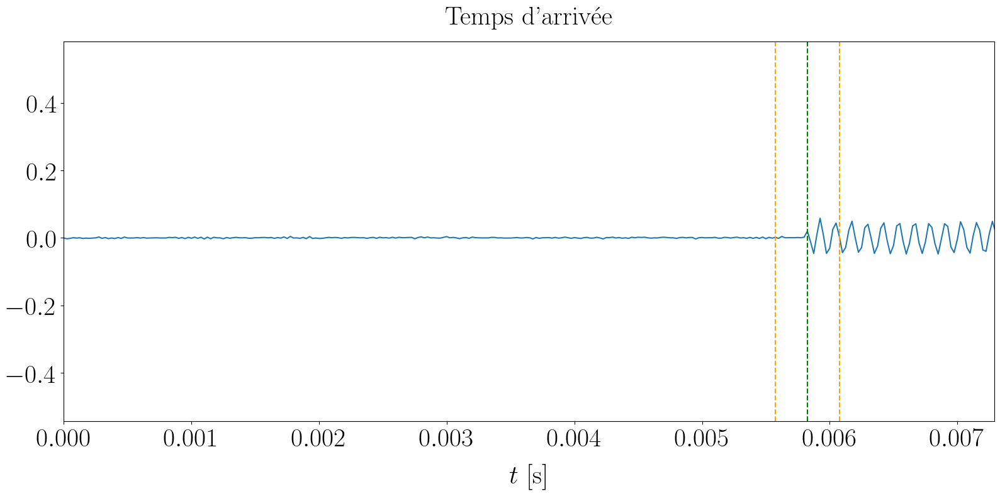

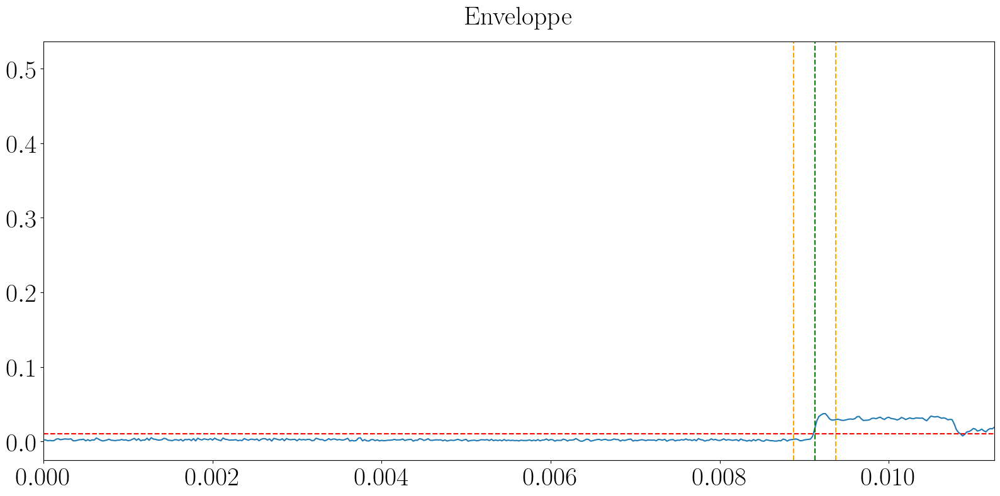

...

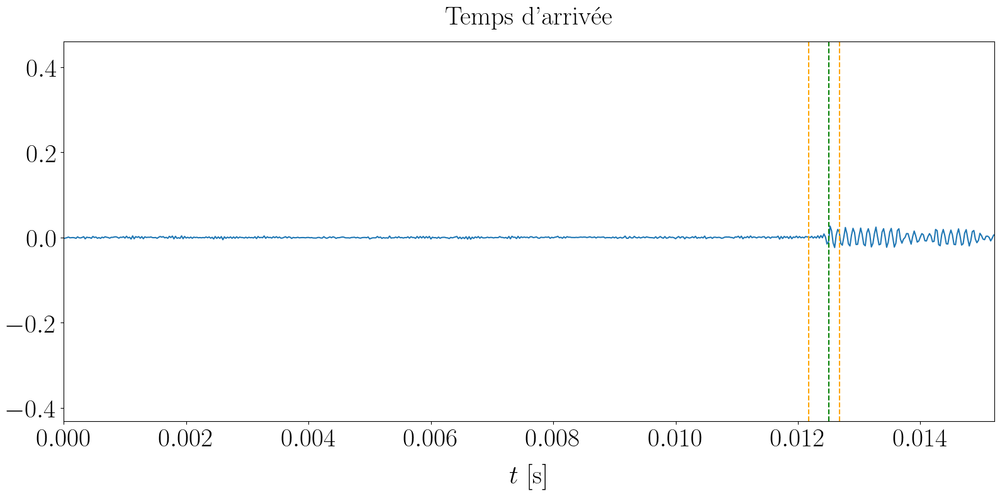

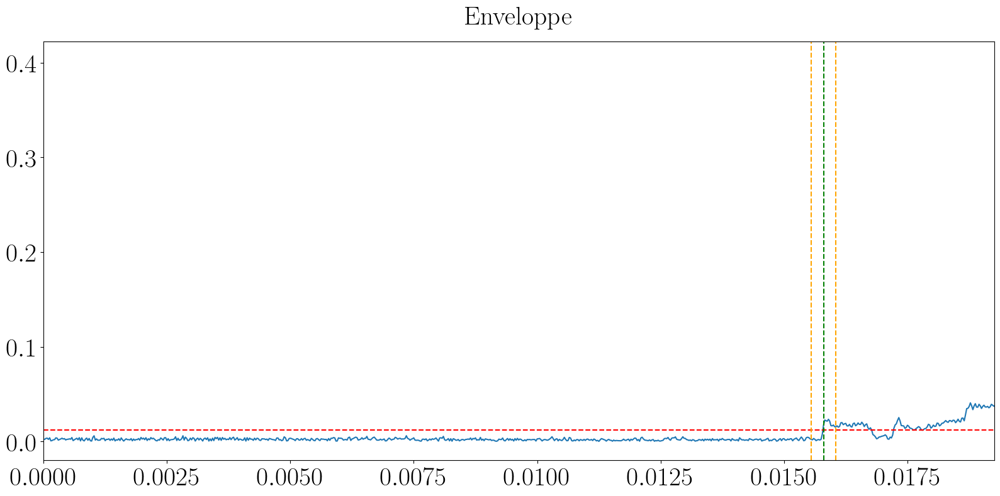

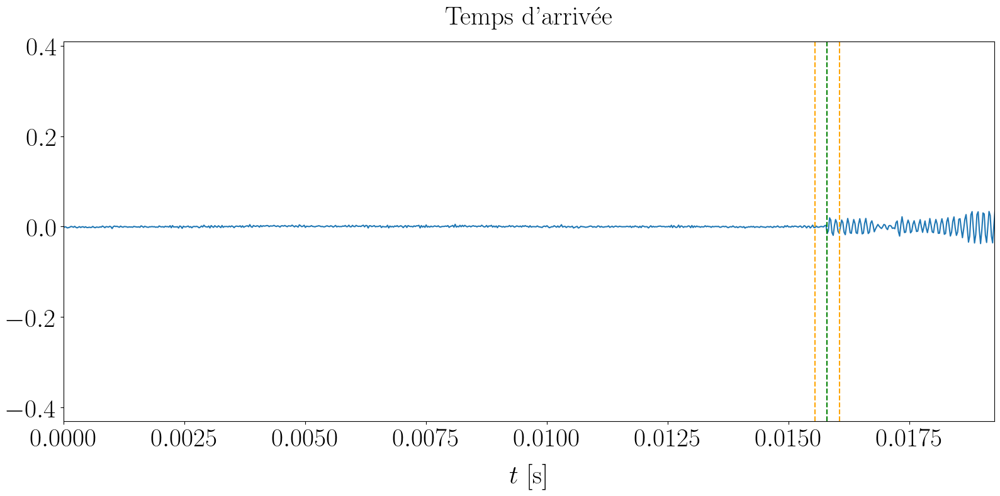

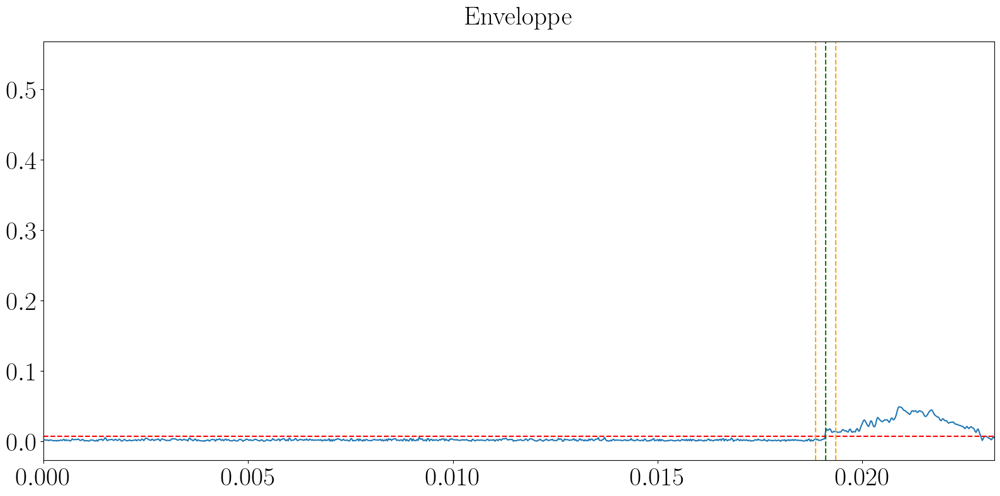

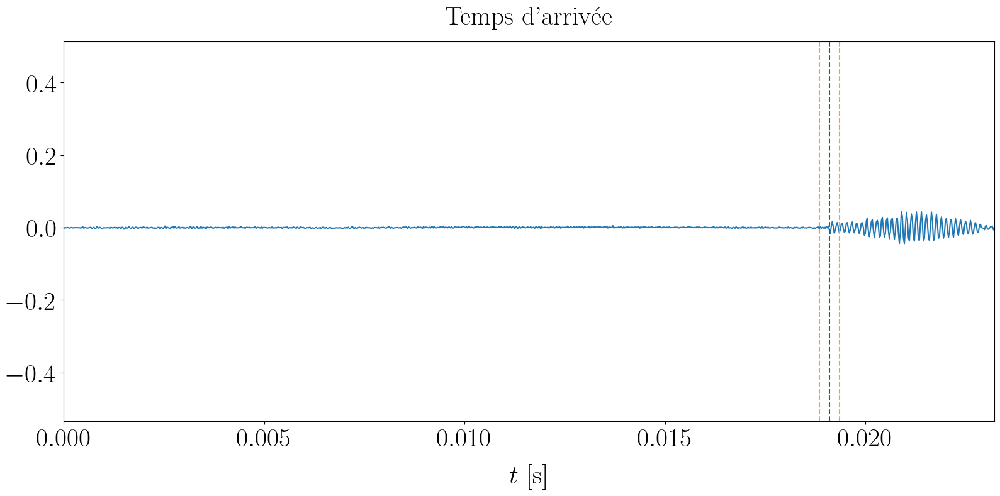

In [58]:
for i, sig in enumerate(signals):
    xr_sir = xr.DataArray(
        signals[i, :], coords=[time], dims=["time"],
    )
    td_env = direct_arrival_env(sig=xr_sir, plot=True, save=False)

    print(td_env.values * c0)

#### Vérification et comparaison des temps détectés

(0.0, 0.02)

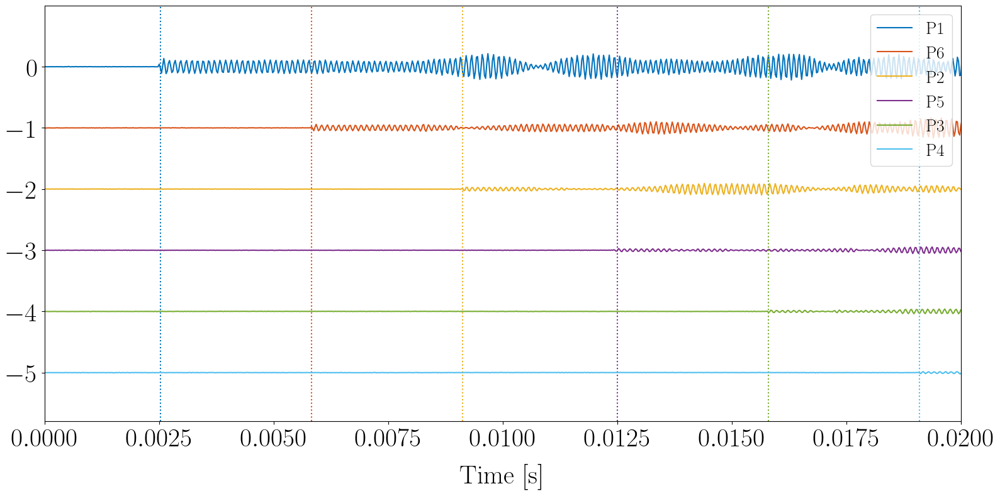

In [59]:
# Stack plot
delta_y = 1
plt.figure()
for i, sig in enumerate(signals):
    sig_n = sig / np.max(np.abs(sig))
    plt.plot(time, sig - i * delta_y, label=src_label_sorted[i], color=color(i))
    # Find arrival time
    xr_sir = xr.DataArray(signals[i, :], coords=[time], dims=["time"])
    td_env = direct_arrival_env(sig=xr_sir, plot=False)
    plt.axvline(td_env, color=color(i), linestyle=":")

plt.legend(loc="upper right")
plt.xlabel("Time [s]")
# plt.ylabel("Amplitude (a.u.)")
plt.xlim([0, 0.02])


#### Généralisation à plusieurs positions et plusieurs pulses 

In [60]:
def all_arrivals(mode="first_pulse", hydro_apriori_pos=None, reject_outlayers=False, outlayer_tol=0.1, c=1500):
    # Estimation du temps de propagation direct pour chacune des positions de la sources e

    # Define the source signal
    tr = fs_sweep.interp_pulse_period
    n_sweep = fs_sweep.n_sweep

    # Init dictionnary
    ds_rtf_fpath = os.path.join(p.root_data, "static", f"{records_to_process[0]}_rtf.nc")
    ds_rtf = xr.open_dataset(ds_rtf_fpath)

    src_pos_labels = np.unique(
        [record_name.split("_")[-4] for record_name in records_to_process]
    )
    rcv_labels = [f"H{idx_rcv}" for idx_rcv in ds_rtf.h_index.values]
    obs = {
        rcv_l: {src_pos_l: {"td": [], "td_var": [], "d2": [], "d2_var": []} for src_pos_l in src_pos_labels}
        for rcv_l in rcv_labels
    }

    dict_th_pos = p.dict_th_pos
    all_dists = np.array([dict_th_pos[pos] for pos in dict_th_pos.keys()])
    idx_pos_sort = np.argsort(all_dists)
    src_labels = list(dict_th_pos.keys())
    src_pos_coords = {src_pos_l: [dict_th_pos[src_pos_l], 0] for src_pos_l in src_labels}
    src_label_sorted = [src_labels[i] for i in idx_pos_sort]

    for idx_rcv in ds_rtf.h_index.values:

        # Iterate overs source positions
        for record_name in records_to_process:
            # Load data
            ds_rtf_fpath = os.path.join(p.root_data, "static", f"{record_name}_rtf.nc")
            ds_rtf = xr.open_dataset(ds_rtf_fpath)

            # Get received signal
            sig = ds_rtf.signal.sel(h_index=idx_rcv)

            src_pos_label = record_name.split("_")[-4]
            rcv_label = f"H{idx_rcv}"

            # Approach 0 : Use only first LFM
            if mode == "first_pulse":
                sig_pulse = sig.sel(time=slice(0, tr))  # Extract first pulse (t in [0, tr])

                td = direct_arrival_env(sig=sig_pulse, plot=False)
                d2 = (td * c)**2
                # print(f"Time of arrival (direct) = {td} s")
                # print(f"Distance (direct) = {d} m")

                # Store results
                obs[rcv_label][src_pos_label]["td"].append(td)
                obs[rcv_label][src_pos_label]["td_var"].append(1)
                obs[rcv_label][src_pos_label]["d2"].append(d2)
                obs[rcv_label][src_pos_label]["d2_var"].append(1)

            # Approach 1 : detect each pulse arrival and derive the mean td
            if mode == "mean_over_all_pulses":
                t_dir = []
                if reject_outlayers:
                    d_apriori = np.sqrt(
                        (
                            hydro_apriori_pos[f"H{idx_rcv}"][0]
                            - src_pos_coords[src_pos_label][0]
                        )
                        ** 2
                        + (
                            hydro_apriori_pos[f"H{idx_rcv}"][1]
                            - src_pos_coords[src_pos_label][1]
                        )
                        ** 2
                    )
                    td_apriori = d_apriori / c

                for ipulse in range(n_sweep):
                    sig_pulse = sig.sel(time=slice(ipulse * tr, (ipulse + 1) * tr))
                    # print(sig_pulse.time)

                    td = direct_arrival_env(sig=sig_pulse, plot=False)
                    td = td.values - ipulse * tr

                    if reject_outlayers:
                        if np.abs(td - td_apriori) / td_apriori < outlayer_tol:
                            t_dir.append(td)
                        else:
                            print(np.abs(td - td_apriori) / td_apriori)
                    else:
                        t_dir.append(td)

                t_dir = np.array(t_dir)
                if t_dir.shape[0] == 0:
                    print(f"H{idx_rcv}, {record_name}: {t_dir.shape}")
                    print(f"td : {td}, td_apriori : {td_apriori}")
                td = np.mean(t_dir)
                td_var = np.var(t_dir)
                d2 = (td * c)**2
                d2_var = np.var((t_dir * c)**2)
                # Store results
                obs[rcv_label][src_pos_label]["td"].append(td)
                obs[rcv_label][src_pos_label]["td_var"].append(td_var)
                obs[rcv_label][src_pos_label]["d2"].append(d2)
                obs[rcv_label][src_pos_label]["d2_var"].append(d2_var)

            # Approach 2 : detect each pulse arrival and derive the mean td
            if mode == "all_pulses":
                t_dir = []
                for ipulse in range(n_sweep):
                    sig_pulse = sig.sel(time=slice(ipulse * tr, (ipulse + 1) * tr))
                    # print(sig_pulse.time)

                    td = direct_arrival_env(sig=sig_pulse, plot=False)
                    td = td.values - ipulse * tr
                    t_dir.append(td)

                td = np.array(t_dir)
                # td = np.mean(t_dir)
                # td_var = np.var(t_dir) * np.ones_like(td)
                td_var = (t_dir - np.mean(t_dir))**2
                d2 = (td * c) ** 2
                # d2_var = np.var(d2) * np.ones_like(d2)
                d2_var = (d2 - np.mean(d2)) ** 2

                # Store results
                obs[rcv_label][src_pos_label]["td"].append(td)
                obs[rcv_label][src_pos_label]["td_var"].append(td_var)
                obs[rcv_label][src_pos_label]["d2"].append(d2)
                obs[rcv_label][src_pos_label]["d2_var"].append(d2_var)

            # Approach 3
            if mode == "single_pulse":
                t_dir = []
                d_apriori = np.sqrt(
                    (
                        hydro_apriori_pos[f"H{idx_rcv}"][0]
                        - src_pos_coords[src_pos_label][0]
                    )
                    ** 2
                    + (
                        hydro_apriori_pos[f"H{idx_rcv}"][1]
                        - src_pos_coords[src_pos_label][1]
                    )
                    ** 2
                )
                td_apriori = d_apriori / c

                for ipulse in range(n_sweep):
                    sig_pulse = sig.sel(time=slice(ipulse * tr, (ipulse + 1) * tr))
                    # print(sig_pulse.time)

                    td = direct_arrival_env(sig=sig_pulse, plot=False)
                    td = td.values - ipulse * tr

                    if np.abs(td - td_apriori) / td_apriori < outlayer_tol:
                        t_dir.append(td)
                    else:
                        print(np.abs(td - td_apriori) / td_apriori)

                td = t_dir[0]
                td_var = 1
                d2 = (td * c)**2
                d2_var = 1
                # Store results
                obs[rcv_label][src_pos_label]["td"].append(td)
                obs[rcv_label][src_pos_label]["td_var"].append(td_var)
                obs[rcv_label][src_pos_label]["d2"].append(d2)
                obs[rcv_label][src_pos_label]["d2_var"].append(d2_var)

    # print(obs)

    # Convert to np arrays in the right order in order to use it in the least-squares
    d2_obs = {rcv_label: [] for rcv_label in obs.keys()}
    d2_obs_var = {rcv_label: [] for rcv_label in obs.keys()}
    t_obs = {rcv_label: [] for rcv_label in obs.keys()}
    t_obs_var = {rcv_label: [] for rcv_label in obs.keys()}

    # Define the order based on the source position : from closest to farthest

    for rcv_label in d2_obs.keys():
        d2_obs_rcv = []
        d2_obs_var_rcv = []
        t_obs_rcv = []
        t_obs_var_rcv = []
        for src_label in src_label_sorted:
            d2_obs_rcv.append(obs[rcv_label][src_label]["d2"])
            d2_obs_var_rcv.append(obs[rcv_label][src_label]["d2_var"])
            t_obs_rcv.append(obs[rcv_label][src_label]["td"])
            t_obs_var_rcv.append(obs[rcv_label][src_label]["td_var"])

        d2_obs[rcv_label] = np.array(d2_obs_rcv)
        d2_obs_var[rcv_label] = np.array(d2_obs_var_rcv)
        t_obs[rcv_label] = np.array(t_obs_rcv)
        t_obs_var[rcv_label] = np.array(t_obs_var_rcv)

    return t_obs, d2_obs, t_obs_var, d2_obs_var

In [19]:
# Define celerity profile 
h = 20      # Max depth 
z = np.linspace(0, h, 100)
# Temperature profile 
t_0 = 17.6
t_h = 14.5
t_z = (t_h - t_0) / h  * z + t_0
# Salinity Profile 
s_0 = 34.6
s_z = np.ones_like(z) * s_0

c_z = arlpy.uwa.soundspeed(
    temperature=t_z,
    salinity=s_z,
    depth=z,
)

In [20]:
# Derive equivalent celerity
h_sw = 10       # Depth of the shallower part of the tank 
z_sw = z[z<=h_sw]
c_z_sw = c_z[z<=h_sw] 
c_eq = equivalent_celerity(c_z_sw, z_sw)
print(f"c_eq = {c_eq} m.s-1")

c_eq = 1481.7084443015103 m.s-1


# Estimation des positions des hydro par moindre carrés 

#### Définition des positions a priori des hydrophones 

In [22]:
# Define the order based on the source position : from closest to farthest
dict_th_pos = p.dict_th_pos
all_dists = np.array([dict_th_pos[pos] for pos in dict_th_pos.keys()])
idx_pos_sort = np.argsort(all_dists)
src_labels = list(dict_th_pos.keys())
src_label_sorted = [src_labels[i] for i in idx_pos_sort]
all_dists_sorted = all_dists[idx_pos_sort]

In [23]:
r1 = -4
z1 = 4.1
dr_hydro = 3

# Depth of positions Pi
zp = 0

def set_apriori_pos(r1, z1, zp=0, dr_h=3):
    hydro_apriori_pos = {
        "H1": [r1, z1],
        "H2": [r1 + dr_h, z1],
        "H3": [r1 + 2 * dr_h, z1],
        "H4": [r1 + 3 * dr_h, z1],
        "H5": [r1 - 0.29, zp+0.001],
    }
    return hydro_apriori_pos

# A priori pos
hydro_apriori_pos = set_apriori_pos(r1, z1, zp=zp, dr_h=dr_hydro)

#### Définition du problème des moindres carrés non linéaire 

In [3]:

# Apply to our problem
def f_d2(X, k, dp=5):
    """
    Parameters
    ----------
    X : array
        [r, z] position of the hydrophone to estimate
    k : array
        index of the position of the source from 0 to N-1 (N-1 = 5 here)
    dp : float
        distance between two consecutive source positions
    """
    r, z = X
    alpha_k = k * dp
    # y = (r + alpha_k)**2 + z**2
    y = (alpha_k - r)**2 + z**2
    return y


def jac_d2(X, k, dp=5):
    """
    Parameters
    ----------
    X : array
        [r, z] position of the hydrophone to estimate
    k : array
        index of the position of the source from 0 to N-1 (N-1 = 5 here)
    dp : float
        distance between two consecutive source positions
    """

    r, z = X
    alpha_k = k * dp
    # df_dr = 2*(r + alpha_k)
    df_dr = 2*(r - alpha_k)
    df_dz = 2*z * np.ones_like(k)
    J = np.array([df_dr, df_dz]).T
    return J

### Estimation de la position de H1

In [34]:
# Première estimation de la position H1 et recalcul des position a priori des autres
# c = c_eq 
c = c0

# mean_over_all_pulses
t_obs, d2_obs, t_obs_var, d2_obs_var = all_arrivals(mode="first_pulse", c=c)

hydro_to_position = f"H1"
r_apriori, z_apriori = hydro_apriori_pos[hydro_to_position]
print(f"A priori position for {hydro_to_position} : r = {r_apriori}, z = {z_apriori}")

X_0 = [r_apriori, z_apriori]
k = np.arange(len(all_dists_sorted))
y = d2_obs[hydro_to_position].flatten()
y_var = d2_obs_var[hydro_to_position].flatten()
# Weighting matrix
# W = np.diag(1 / y_var)
W = np.eye(len(y))

X_hat, dY_hat, cost_hat, _, _ = calc_wls(Y=y, t=k, X_0=X_0, W=W, fct=f_d2, jac=jac_d2, tol=1e-6, verbose=False)
print(f"Estimated position for {hydro_to_position} : r = {X_hat[0]}, z = {X_hat[1]}")
print(f"Residuals : {dY_hat}")
print(f"Final cost : {cost_hat}")

A priori position for H1 : r = -4, z = 4.1
Estimated position for H1 : r = -3.4960214285711637, z = 4.139105493946699
Residuals : [-0.59795388  0.69808183  0.59411755 -0.60609674 -0.37271728  0.28456844]
Final cost : 1.7850933696067728
Updated apriori pos : {'H1': [-3.4960214285711637, 4.139105493946699], 'H2': [-0.4960214285711637, 4.139105493946699], 'H3': [2.5039785714288363, 4.139105493946699], 'H4': [5.503978571428837, 4.139105493946699], 'H5': [-3.7860214285711637, 0.001]}


#### Mise à jour des positions a priori connaissant la position estimée de H1

In [ ]:
# Update apriori positions
hydro_apriori_pos = set_apriori_pos(r1=X_hat[0], z1=X_hat[1], zp=zp, dr_h=dr_hydro)
print(f"Updated apriori pos : {hydro_apriori_pos}")

#### Re-calcul des temps d'arrivée en excluant les outlayers 

In [35]:
# Recalculate td by rejecting outlayers
t_obs, d2_obs, t_obs_var, d2_obs_var = all_arrivals(mode="mean_over_all_pulses", reject_outlayers=True, hydro_apriori_pos=hydro_apriori_pos, c=c, outlayer_tol=0.1)
# t_obs, d2_obs, t_obs_var, d2_obs_var = all_arrivals(
#     mode="single_pulse", reject_outlayers=True, hydro_apriori_pos=hydro_apriori_pos
# )

0.36739769828576235
0.3816414243086773
0.5354736653653891
0.3730951886925601
0.11670812026207568
0.20498377459009892
0.10201219049932927


### Application des LMS à l'ensemble des hydrophones

In [37]:
# Real case
logs = []
dp = 5
hydro_pos_hat = hydro_apriori_pos
hydro_pos_hat_sigmaX = {hydro_lab: None for hydro_lab in list(hydro_pos_hat.keys())}
for i in range(1, 6):

    hydro_to_position = f"H{i}"
    r_apriori, z_apriori = hydro_apriori_pos[hydro_to_position]
    logs.append("----------------------------------")
    logs.append(f"A priori position for {hydro_to_position} : r = {r_apriori}, z = {z_apriori}")
    # print("----------------------------------")
    # print(f"A priori position for {hydro_to_position} : r = {r_apriori}, z = {z_apriori}")

    X_0 = [r_apriori, z_apriori]
    k = np.arange(len(all_dists_sorted))
    y = d2_obs[hydro_to_position].flatten()
    y_var = d2_obs_var[hydro_to_position].flatten()
    # Weighting matrix
    # W = np.diag(1 / y_var)
    W = np.eye(len(y))

    X_hat, dY_hat, cost_hat, sigmaXhat, sigma02hat = calc_wls(
        Y=y, t=k, X_0=X_0, W=W, fct=f_d2, jac=jac_d2, tol=1e-9, verbose=False
    )
    logs.append(f"Estimated position for {hydro_to_position} : r = {X_hat[0]}, z = {X_hat[1]}")
    logs.append("### Diag WLMS (d2) ### ")
    logs.append(f"Residuals (d2): {dY_hat}")
    logs.append(f"Final cost (d2): {cost_hat}")
    logs.append(f"Sigma02 hat : {sigma02hat}")

    # print(f"Estimated position for {hydro_to_position} : r = {X_hat[0]}, z = {X_hat[1]}")
    # print(f"Residuals (d2): {dY_hat}")
    # print(f"Final cost (d2): {cost_hat}")

    eps_d = np.sqrt(y) - np.sqrt(f_d2(X_hat, k=k, dp=dp))
    cost_d = np.sum(eps_d**2)

    logs.append("### Diag d ### ")
    logs.append(f"Residuals (d): {eps_d}")
    logs.append(f"Final cost (d): {cost_d}")

    # print(f"Residuals (d): {eps_d}")
    # print(f"Final cost (d): {cost_d}")

    # Save estimated positions
    hydro_pos_hat[hydro_to_position] = X_hat
    hydro_pos_hat_sigmaX[hydro_to_position] = sigmaXhat

    # print("----------------------------------")

print("\n".join(logs))
print(f"Estimated positions : {hydro_pos_hat}")

# Save logs
log_fpath = os.path.join(p.root_data, "hydro_positions", f"hydro_pos_estimation_logs.txt")
with open(log_fpath, "w") as f:
    f.write("\n".join(logs))

----------------------------------
A priori position for H1 : r = -3.4960214285711637, z = 4.139105493946699
Estimated position for H1 : r = -3.509175089232888, z = 4.104796475618708
### Diag WLMS (d2) ### 
Residuals (d2): [-0.40725769  0.61498517  0.09784052 -0.81001037  0.90284655 -0.39840434]
Final cost (d2): 2.1836130616744542
Sigma02 hat : 0.5459032654186136
### Diag d ### 
Residuals (d): [-0.03783924  0.03249161  0.00346442 -0.02137435  0.01890834 -0.00691681]
Final cost (d): 0.0033617453548074453
----------------------------------
A priori position for H2 : r = -0.4960214285711637, z = 4.139105493946699
Estimated position for H2 : r = -0.5594832276288223, z = 3.9698948037433652
### Diag WLMS (d2) ### 
Residuals (d2): [-0.27246124  0.42598774  0.31427421 -0.73635807  0.18824872  0.08030863]
Final cost (d2): 0.9385792151062508
Sigma02 hat : 0.23464480377656266
### Diag d ### 
Residuals (d): [-0.03412537  0.03110786  0.01392067 -0.02294455  0.00449463  0.00155235]
Final cost (d): 0

#### Illustration des résultats

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


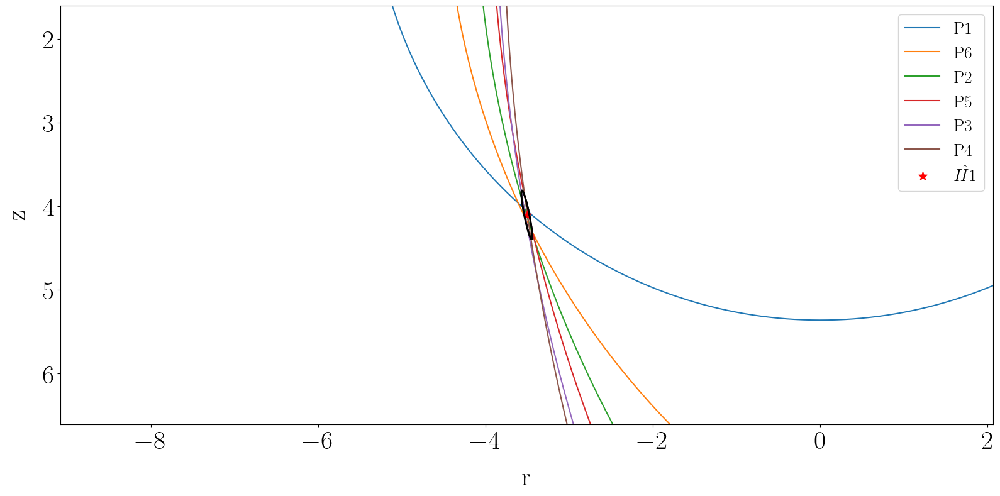

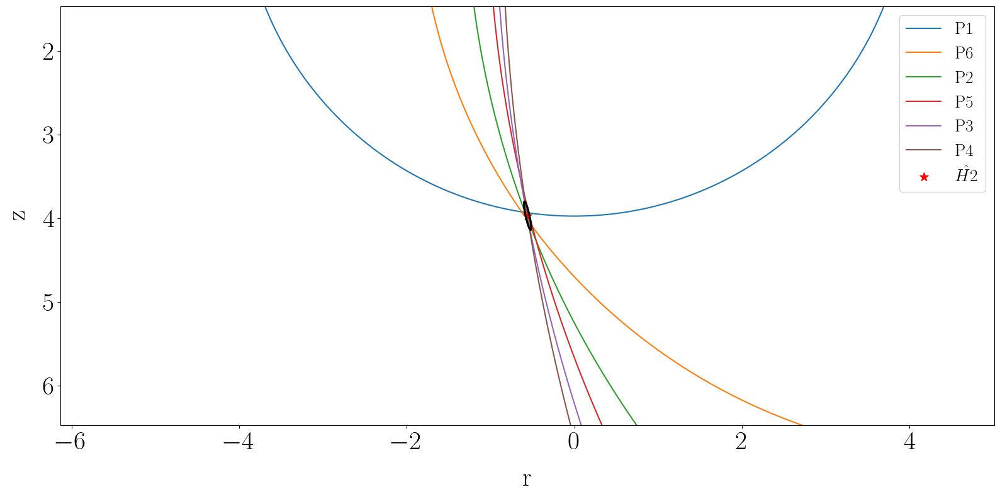

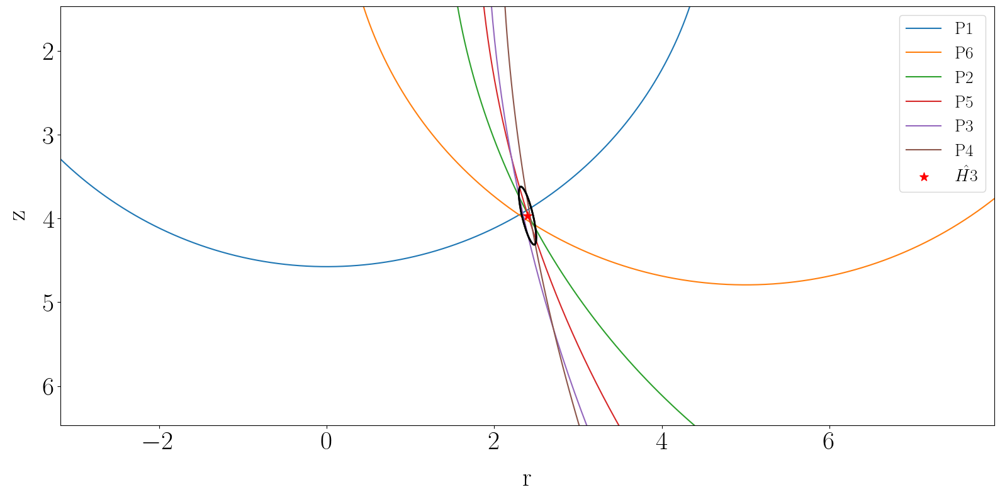

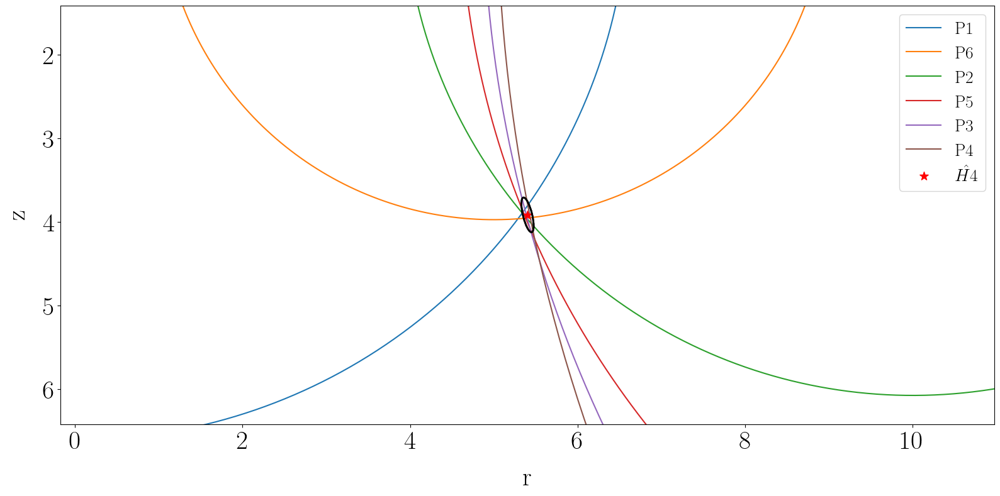

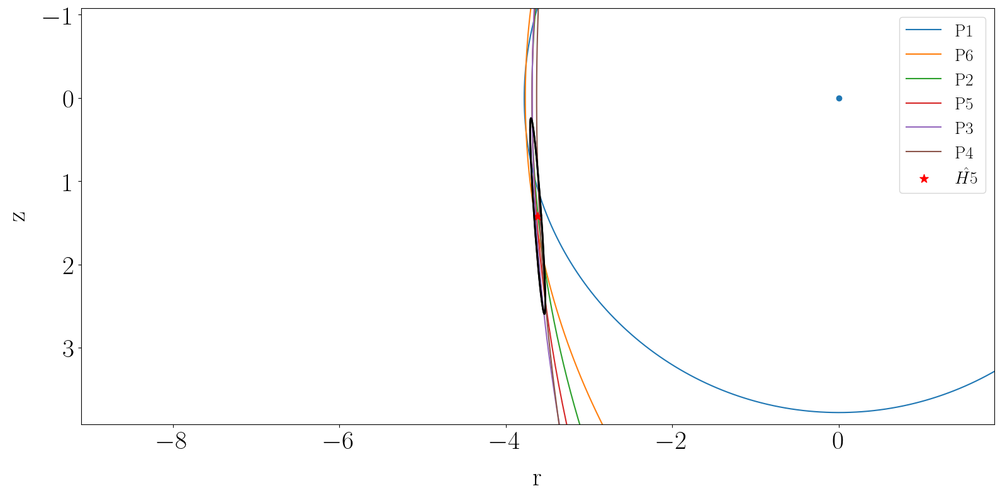

In [41]:
# Illustration
theta = np.linspace(0, 2*np.pi, 1000)
for i in range(1, 6):

    hydro_to_position = f"H{i}"
    hydro_to_position_label = f"H_{i}"

    plt.figure()
    for ip, rp in enumerate(all_dists_sorted):
        plt.scatter(rp, 0)
        r = np.sqrt(d2_obs[hydro_to_position][ip])
        rc = r * np.cos(theta) + rp
        zc = r * np.sin(theta) + 0
        plt.plot(rc, zc,  label=src_label_sorted[ip])

    # # A priori position
    # rh, zh = hydro_apriori_pos[hydro_to_position]
    # # print(rh, zh)
    # plt.scatter(rh, zh, marker="s", s=100, color="k", label=hydro_to_position + r"$_{apriori}$")
    # Estimated position
    rhe, zhe = hydro_pos_hat[hydro_to_position]
    plt.scatter(
        rhe,
        zhe,
        marker="*",
        s=100,
        color="r",
        label=r"$\hat{" + hydro_to_position_label + r"}$",
        zorder=10,
    )
    plt.legend()

    # Add confidence ellipse
    alpha = 0.95
    # nombre d'observations
    nobs = y.shape[0]
    # nombre de paramètres inconnus
    nparams = hydro_pos_hat[hydro_to_position].shape[0]
    ddl = nobs - nparams 
    draw_ellipse(X=hydro_pos_hat[hydro_to_position], SigmaX=hydro_pos_hat_sigmaX[hydro_to_position], ddl=ddl, alpha=alpha, title="", color="k", fac=1)

    ax = plt.gca()
    ax.axis("equal")
    plt.xlabel("r")
    plt.ylabel("z")
    # plt.xlim(-10, 40)
    # plt.ylim(-5, 45)
    plt.xlim(rhe - 2.5, rhe + 2.5)
    plt.ylim(zhe - 2.5, zhe + 2.5)
    ax.invert_yaxis()

    fpath = os.path.join(
        img_root, f"{hydro_to_position}_estimated_position.png"
    )
    plt.savefig(fpath)

#### Sauvegarde des résultats

In [45]:
# Save estimated positions
df_hydro_pos = pd.DataFrame.from_dict(hydro_pos_hat, orient="index", columns=["r", "z"])
# Set Hi column as index 
df_hydro_pos.index.name = "h_index"
df_hydro_pos.to_csv(os.path.join(p.root_data, "hydro_positions", "hydrophones_estimated_positions.csv"))

### Localisation des hydrophones par TDOA 

On cherche à estimer la position $\begin{pmatrix} r \\ z \end{pmatrix}$ de l'hydrophone, par exemple $H_1$.

On dispose des enregistrements correspondant aux positions de la source de $P_0$ à $P_5$ noté $P_j \begin{pmatrix} r_j \\ z_j \end{pmatrix}$. L'origine du repère est choisie en $P_0$ de telle sorte que $r_j = j \times \Delta_r, z_j = 0$, $j \in [0, 5]$.

Soit $j \in [0, 5]$,

$$
D_j^2 = \lVert P_jH_1\rVert^2 = (r_j - r)^2 + (z-z_j)^2 = (r_j - r)^2 + z^2   
$$

Pour la position de référence (j=0) : 

$$
(1) \quad \quad D_0^2 = (r_0 - r)^2 + z^2 = r_0^2 - 2r_0r + z^2  = z^2
$$

Or on peut écrire pour $j \in [1, 5]$ :

$$
(2) \quad \quad D_j^2 = (D_0 + \delta D_j)^2 = D_0^2 + 2D_0 \delta D_j + D_j^2
$$

Et, 

$$
(3) \quad \quad  D_0^2 + 2D_0 \delta D_j + D_j^2 =  r_j^2 - 2r_jr + z^2 
$$

Ainsi, on peut écrire (3) - (2) : 

$$
(4) \quad \quad  2D_0 \delta D_j + D_j^2 =  r_j^2 - 2r_jr
$$

En pratique on mesure des différences de temps d'arrivée $\delta T_j = T_j - T_0$, $\delta D_j = c \delta T_j$. 

Et donc (4) s'écrit :
$$
(4) \quad \quad  2D_0 c \delta T_j + (c \delta T_j)^2 =  r_j^2 - 2r_jr
$$

On a donc 3 inconnues ($D_0, c, r$) pour 5 équations ($j \in [1, 5]$).



# Left over

### Détection après compression d'impulsion 

Piste abandonnée, inutile pour l'application simple visée 

In [ ]:
# Apply wave compression
t_pulse = fs_sweep.pulse_length
t = time.sel(time=slice(0, t_pulse)).values
f0 = fs_sweep.fmin
f1 = fs_sweep.fmax
sig_source = sp.chirp(t, f0=f0, f1=f1, t1=t_pulse, method="linear")


spec_source = np.fft.fft(sig_source, n=len(time))
f = np.fft.fftfreq(len(time), d=1 / fs)

# Smooth with a gaussian window
fc = (f1 - f0) / 2 + f0
bw = (f1 - f0) * 1
gauss_win_neg = np.exp(-0.5 * ((f + fc) / (bw / 4)) ** 2)
gauss_win_pos = np.exp(-0.5 * ((f - fc) / (bw / 4)) ** 2)
gauss_win = gauss_win_neg * (f < 0) + gauss_win_pos * (f >= 0)
spec_source_smooth = spec_source * gauss_win

# Time signals 
sig_source = np.fft.ifft(spec_source, n=len(time)).real
sig_source_smooth = np.fft.ifft(spec_source_smooth, n=len(time)).real

# Compute cross-correlation
mf = []

for i_sig in range(signals.shape[0]): 
    sig = signals[i_sig]
    spec_sig = np.fft.fft(sig, n=len(time))
    mf_spec = spec_sig * np.conj(spec_source_smooth)    
    mf_sig = np.fft.ifft(mf_spec)
    mf.append(mf_sig.real)

mf = np.array(mf)

# lags =
lags = (
    sp.correlation_lags(sig.size, sig_source_smooth.size, mode="same") * 1 / fs
)


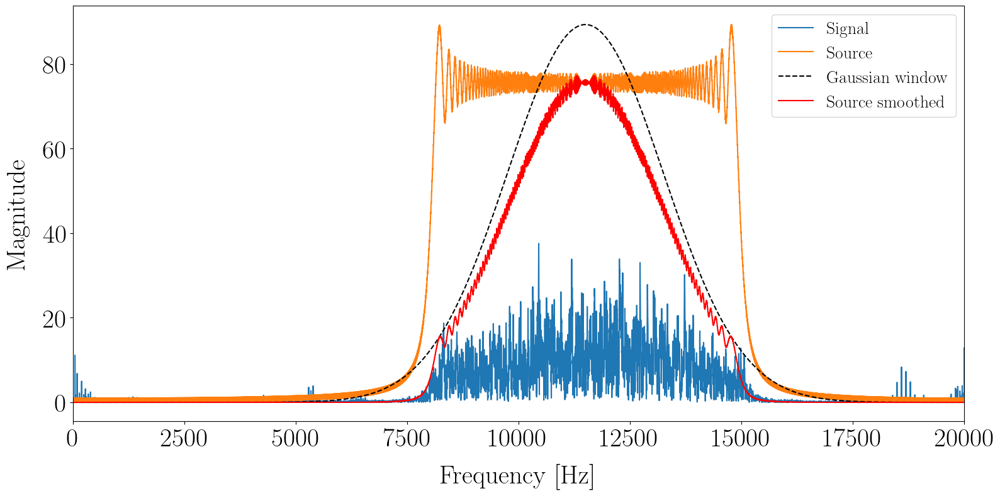

In [ ]:
x_f = np.fft.fft(sig)
f = np.fft.fftfreq(n=sig.size, d=1 / ds_rtf.fs)

plt.figure()
plt.plot(np.fft.fftshift(f), np.fft.fftshift(np.abs(x_f)), label="Signal")
plt.plot(np.fft.fftshift(f), np.fft.fftshift(np.abs(spec_source)), label="Source")
plt.plot(
    np.fft.fftshift(f),
    np.fft.fftshift(gauss_win * np.max(np.abs(spec_source))),
    "--k",
    label="Gaussian window",
)
plt.plot(
    np.fft.fftshift(f),
    np.fft.fftshift(np.abs(spec_source_smooth)),
    "-r",
    label="Source smoothed",
)
plt.xlim([0, fs/2])
plt.xlabel("Frequency [Hz]")
plt.ylabel("Magnitude")
plt.legend()


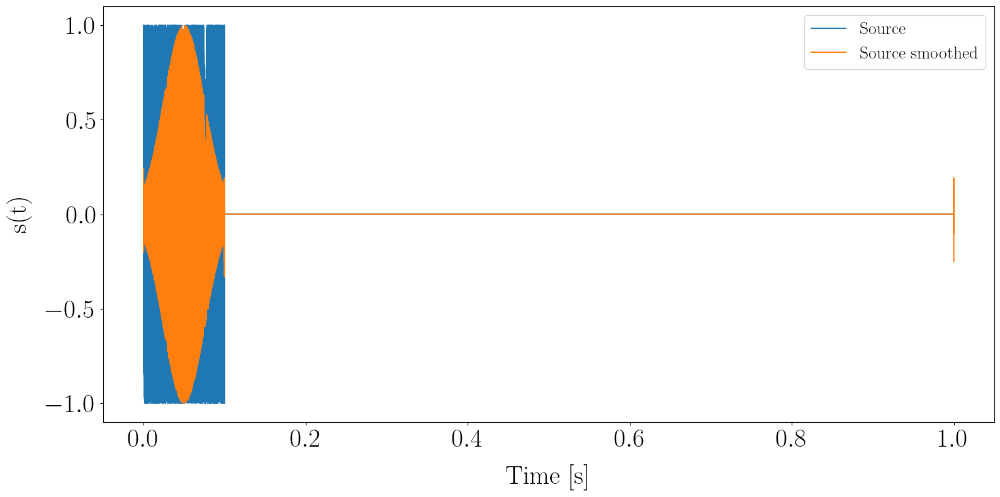

In [ ]:
plt.figure()
plt.plot(time, sig_source, label="Source")
plt.plot(time, sig_source_smooth, label="Source smoothed")
plt.xlabel("Time [s]")
plt.ylabel("s(t)")
plt.legend()

(0.0, 0.025)

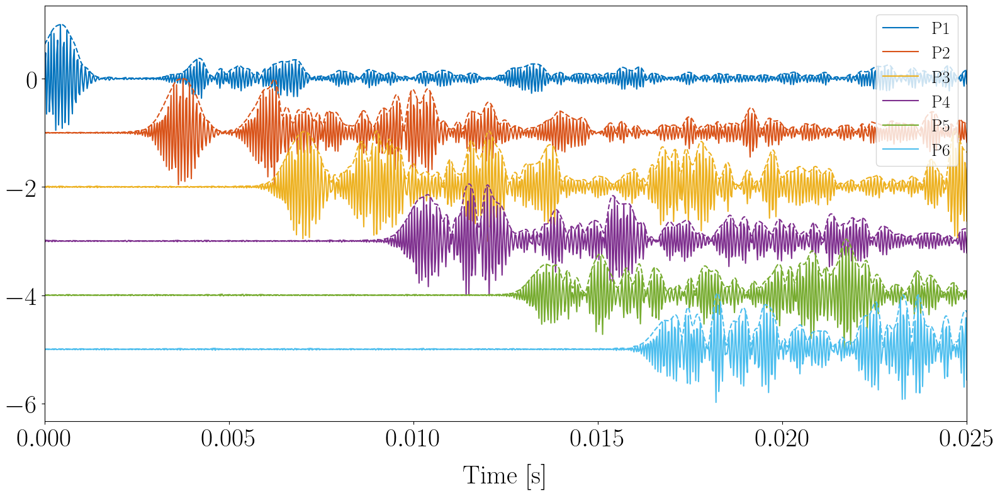

In [ ]:
# Stack plot
delta_y = 1
plt.figure()
for i, mf_sig in enumerate(mf):
    mf_sig_n = mf_sig / np.max(np.abs(mf_sig))
    plt.plot(time, mf_sig_n - i * delta_y, label=src_labels[i], color=color(i))
    mf_sig_n_env = np.abs(sp.hilbert(mf_sig_n))
    plt.plot(time, mf_sig_n_env - i * delta_y, color=color(i), linestyle='--')
plt.legend(loc="upper right")
plt.xlabel("Time [s]")
# plt.ylabel("Amplitude (a.u.)")
plt.xlim([0, 0.025])

In [ ]:
# Stack plot
delta_y = 1
plt.figure()
plt.plot(time, sig_source_smooth + 1 * delta_y, label="source", color="k")
for i, mf_sig in enumerate(mf):
    mf_sig_n = mf_sig / np.max(np.abs(mf_sig))
    plt.plot(time, mf_sig_n - i * delta_y, label=src_labels[i], color=color(i))
    mf_sig_n_env = np.abs(sp.hilbert(mf_sig_n))
    plt.plot(time, mf_sig_n_env - i * delta_y, color=color(i), linestyle="--")
    # Find arrival time
    xr_sir = xr.DataArray(signals[i, :], coords=[time], dims=["time"])
    td_env = direct_arrival_env(sig=xr_sir, plot=False)
    plt.axvline(td_env, color=color(i), linestyle=":")

plt.legend(loc="upper right")
plt.xlabel("Time [s]")
# plt.ylabel("Amplitude (a.u.)")
plt.xlim([0, 0.02])

# Stack plot
delta_y = 1
plt.figure()
for i, mf_sig in enumerate(mf):
    mf_sig_n = mf_sig / np.max(np.abs(mf_sig))
    plt.plot(time, mf_sig_n - i * delta_y, label=src_labels[i], color=color(i))
    mf_sig_n_env = np.abs(sp.hilbert(mf_sig_n))
    plt.plot(time, mf_sig_n_env - i * delta_y, color=color(i), linestyle="--")
    # Find arrival time
    xr_sir = xr.DataArray(signals[i, :], coords=[time], dims=["time"])
    td_env = direct_arrival_env(sig=xr_sir, plot=False)
    plt.axvline(td_env, color=color(i), linestyle=":")

plt.legend(loc="upper right")
plt.xlabel("Time [s]")
# plt.ylabel("Amplitude (a.u.)")
# plt.xlim([0, 0.02])